# Supplementary Jupyter notebook

This notebook demonstrate use of Python __[APSG package](https://github.com/ondrolexa/apsg)__ for calculation presented in the submitted manuscript.

In [1]:
%pylab inline
from IPython.display import HTML

Populating the interactive namespace from numpy and matplotlib


In [2]:
from apsg import *
settings['figsize'] = (10, 8)
np.random.seed(6557841)

### Definition of simulation parameters
Here we define number of fabric elements `N`, reference strain rate `sr`, total time of simulation `tot_time` and number of steps `steps`. We use random normal distribution for initial planar and linear fabrics. See `Group.randn_fol` and `Group.randn_lin` methods of APSG.

In [3]:
############## HER YOU CAN MODIFY MODEL PARAMETERS ######################
N = 300                                    # number of fols or lins
sr = 3e-14                                 # strain rate
ss = -1.6                                  # multiplier of reference shear strain rate
steps = 100                                # number of iterations
tot_time = 2                               # time of model run in Ma
S2 = Group.randn_fol(N, Fol(105, 80))      # initial planar fabrics
L3 = Group.randn_lin(N, Lin(194, 5))       # initial linear fabrics
#########################################################################
Mas = 365.25*24*3600*1e6                   # million years in seconds
tsteps = linspace(0, tot_time*Mas, steps)  # array of timesteps

The orientation of deformation's kinematic frame is parametrised in terms of "fabric attractor" `Atr` defined here. Pole of fabric attractor foliation correspond to Z-axis and fabric attractor lineation corresponds to X-axis of deformation kinematic frame.

In [4]:
Atr = Pair(120, 25, 120, 25)
print('Corrected attractor pair: {}'.format(Atr))

Corrected attractor pair: P:120/25-120/25


Velocity gradient tensor `L` is defined within deformation zone coordinate system and than rotated to coordinates defined by fabric attractor.

<img src='Fig12_model_definition4.png' width='50%'>

## Reference model

In [5]:
R = DefGrad.from_pair(Atr)
L = VelGrad.from_comp(zz=-sr, yy=0, xx=sr, xz=ss*sr).rotate(R)

Deformation gradient `F` is calculated from velocity gradient `L` according to equation: $\mathbf{F}=\mathrm{e}^{\mathbf{L}t}$

In [6]:
F = L.defgrad(time=tot_time*Mas)

Now we can plot initial and final fabric distribution in stereographic projection

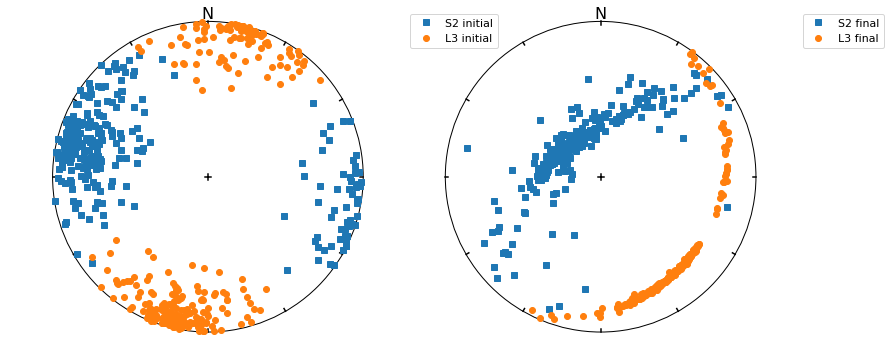

In [7]:
s = StereoNet(ncols=2, figsize=(16,6))
s.pole(S2, label='S2 initial')
s.line(L3, label='L3 initial')
s.active = 1
s.pole(S2.transform(F), label='S2 final')
s.line(L3.transform(F), label='L3 final')

APSG allows to generate animation to visualise progressive deformation and fabric transposition during deformation.

### Progresive deformation of planar elements

In [8]:
s = StereoNet()
s.pole(Atr.fol, 'go', label='Atr Fol')
for t in tsteps:
    s.pole(S2.transform(L.defgrad(t)), color='C0', animate=True)
anim = s.animate(interval=80)
s.close()
HTML(anim.to_jshtml())

### Progresive deformation of linear elements

In [9]:
s = StereoNet()
s.line(Atr.lin, 'go', label='Atr Lin')
for t in tsteps:
    s.line(L3.transform(L.defgrad(t)), color='C1', animate=True)
anim = s.animate(interval=80)
s.close()
HTML(anim.to_jshtml())

### Fabric evolution
Evolution of fabric symmetry and intensity during progressive deformation could be visualised in *Vollmer plot* or *Hsu plot*. At first, we generate a list of orientation tensors derived from planar and linear elements for individual time steps...

In [10]:
OtS2 = [S2.transform(D, norm=True).ortensor for D in L.defgrad(time=tsteps)]
OtL3 = [L3.transform(D, norm=True).ortensor for D in L.defgrad(time=tsteps)]

... and than we can generate plots.

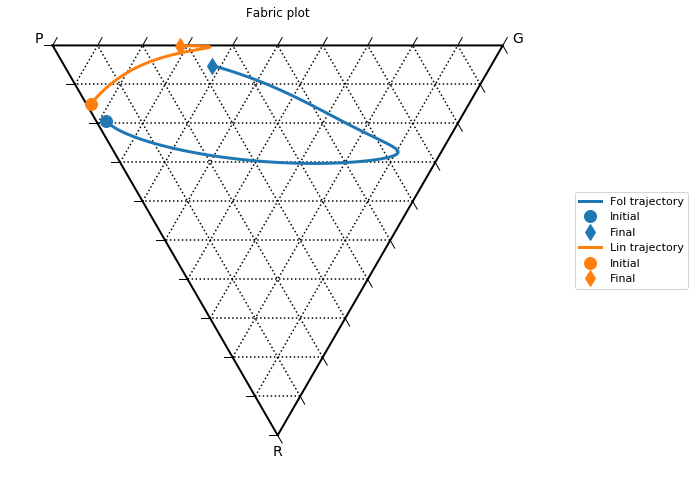

In [11]:
v = VollmerPlot()
v.path(OtS2, '-', color='C0', lw=3, label='Fol trajectory')
v.plot(OtS2[0], 'o', color='C0', ms=12, label='Initial')
v.plot(OtS2[-1], 'd', color='C0', ms=12, label='Final')
v.path(OtL3, '-', color='C1', lw=3, label='Lin trajectory')
v.plot(OtL3[0], 'o', color='C1', ms=12, label='Initial')
v.plot(OtL3[-1], 'd', color='C1', ms=12, label='Final')

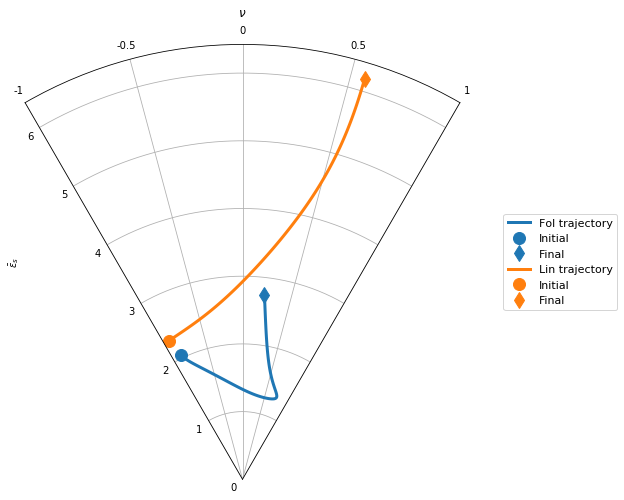

In [12]:
v = HsuPlot()
v.path(OtS2, '-', color='C0', lw=3, label='Fol trajectory')
v.plot(OtS2[0], 'o', color='C0', ms=12, label='Initial')
v.plot(OtS2[-1], 'd', color='C0', ms=12, label='Final')
v.path(OtL3, '-', color='C1', lw=3, label='Lin trajectory')
v.plot(OtL3[0], 'o', color='C1', ms=12, label='Initial')
v.plot(OtL3[-1], 'd', color='C1', ms=12, label='Final')

Following plot shows progressive rotation of mean orientation of modelled linear elements towards attractor lineation (finite stretching) in time.

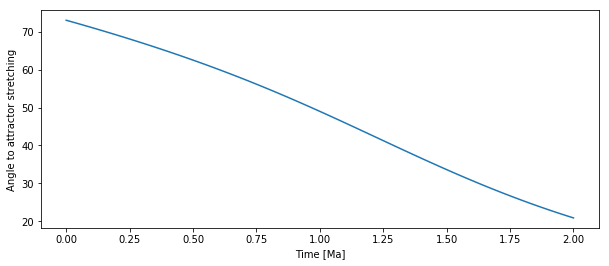

In [13]:
figure(figsize=(10,4))
ang = [L3.transform(D, norm=True).ortensor.eigenlins[0].angle(Atr.lvec) for D in L.defgrad(time=tsteps)]
plot(tsteps/Mas, ang)
xlabel('Time [Ma]')
ylabel('Angle to attractor stretching');

### Retro deformation of surface section
Following script calculates inverse deformation of the vector (`mfg`) corresponding to section observed on the surface to find out initial positions of rocks exposed in the footwall of the shear zone.

In [14]:
mfg = 12*Vec3(300,0)

In [15]:
V = Group([mfg.transform(D) for D in (-L).defgrad(time=tsteps)])
z = abs(V.proj(Lin(0,90)))
ld = abs(Group([v-mfg-(v-mfg).proj(Lin(0,90)) for v in V]))

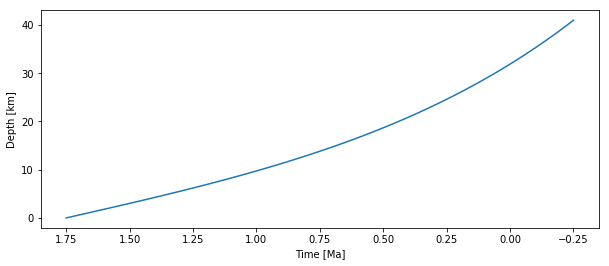

In [16]:
fig, ax = subplots(figsize=(10,4))
ax.plot(tsteps[::-1]/Mas - 0.25, z)
ax.invert_xaxis()
ax.set_xlabel('Time [Ma]')
ax.set_ylabel('Depth [km]');

Here we plot lateral displacement shear zone footwall exposed on the surface during retro-deformation.

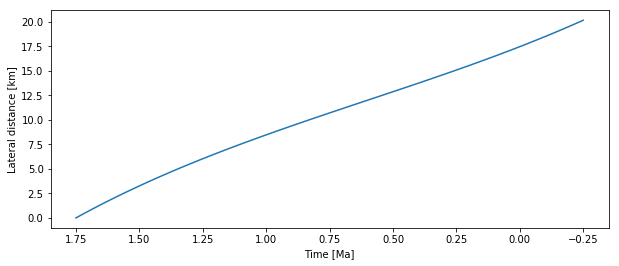

In [17]:
fig, ax = subplots(figsize=(10,4))
ax.plot(tsteps[::-1]/Mas - 0.25, ld)
ax.invert_xaxis()
ax.set_xlabel('Time [Ma]')
ax.set_ylabel('Lateral distance [km]');

## Effect of sense of shear
Following scripts elaborate the effect of opposite sense of shear within studied shear zone on studied parameters

### Strain evolution during reverse and normal sense of shear
This plot shows evolution of finite strain for reverse and normal sense of shear within shear zone. The orientation of incremental deformation (low finite strain) should correspond to orientation of S3 in Phyllite belt.

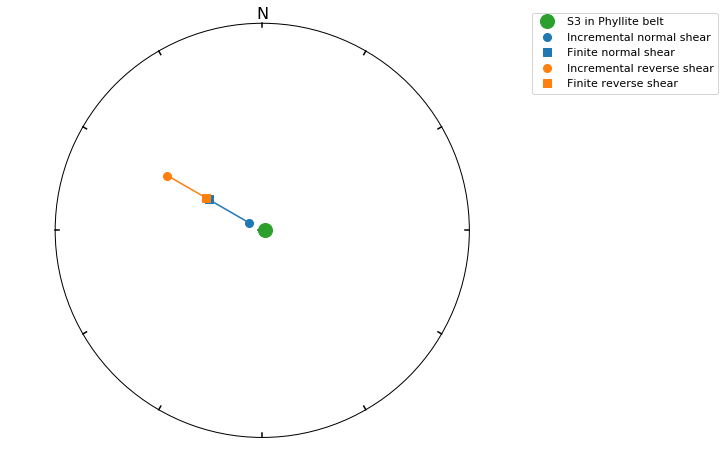

In [18]:
Ln = VelGrad.from_comp(zz=-sr, yy=0, xx=sr, xz=ss*sr).rotate(R)
Lt = VelGrad.from_comp(zz=-sr, yy=0, xx=sr, xz=-ss*sr).rotate(R)
Dn = Group([D.eigenfols[2] for D in Ln.defgrad(time=tsteps[1:])])
Dt = Group([D.eigenfols[2] for D in Lt.defgrad(time=tsteps[1:])])
s = StereoNet()
s.pole(Fol(253, 1), color='C2', marker='o', ms=14, label='S3 in Phyllite belt')
s.pole(Dn[0], color='C0', marker='o', ms=8, label='Incremental normal shear')
s.pole(Dn[-1], color='C0', marker='s', ms=8, label='Finite normal shear')
s.pole(Dn, ls='-', marker=None, color='C0')
s.pole(Dt[0], color='C1', marker='o', ms=8, label='Incremental reverse shear')
s.pole(Dt[-1], color='C1', marker='s', ms=8, label='Finite reverse shear')
s.pole(Dt, ls='-', marker=None, color='C1')

### Initial and final distribution of planar and linear elements in thrust
Here the planar elements show clustered distribution and linear elements show girdle distribution in final stage (same time as for reference model), which contradicts field observations.

In [19]:
L = VelGrad.from_comp(zz=-sr, yy=0, xx=sr, xz=-ss*sr).rotate(R)
F = L.defgrad(time=tot_time*Mas)

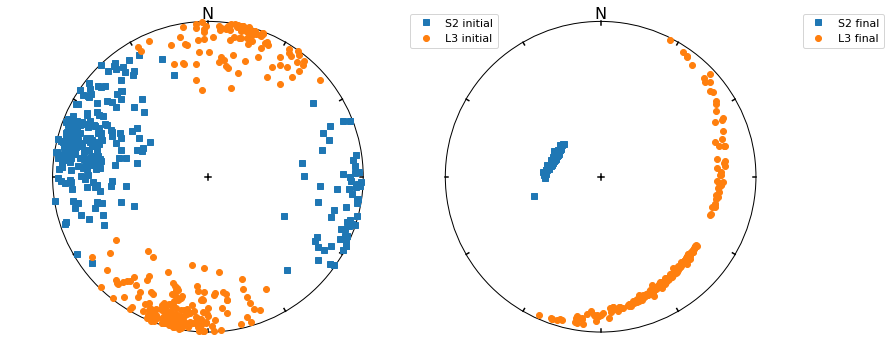

In [20]:
s = StereoNet(ncols=2, figsize=(16,6))
s.pole(S2, label='S2 initial')
s.line(L3, label='L3 initial')
s.active = 1
s.pole(S2.transform(F), label='S2 final')
s.line(L3.transform(F), label='L3 final')

### Progresive deformation of planar elements in thrust

In [21]:
s = StereoNet()
s.pole(Atr.fol, 'go', label='Atr Fol')
for t in tsteps:
    s.pole(S2.transform(L.defgrad(t)), color='C0', animate=True)
anim = s.animate(interval=80)
s.close()
HTML(anim.to_jshtml())

### Progresive deformation of linear elements in thrust

In [22]:
s = StereoNet()
s.line(Atr.lin, 'go', label='Atr Lin')
for t in tsteps:
    s.line(L3.transform(L.defgrad(t)), color='C1', animate=True)
anim = s.animate(interval=80)
s.close()
HTML(anim.to_jshtml())

In [23]:
OtS2 = [S2.transform(D, norm=True).ortensor for D in L.defgrad(time=tsteps)]
OtL3 = [L3.transform(D, norm=True).ortensor for D in L.defgrad(time=tsteps)]

Evolution of distribution of planar and linear elements shown in *Volmer plot*:

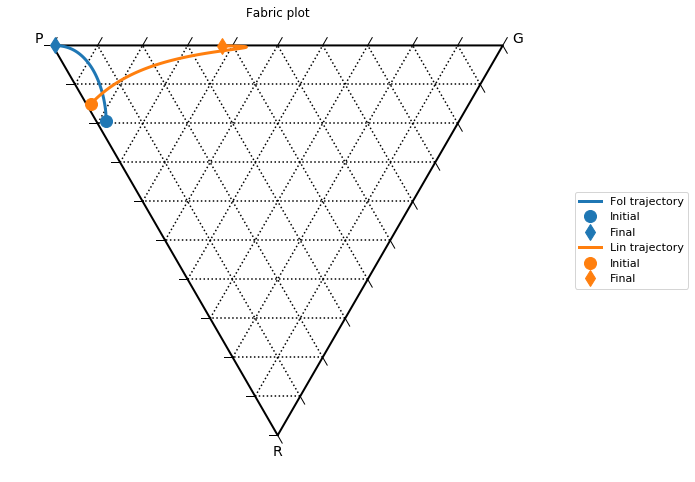

In [24]:
v = VollmerPlot()
v.path(OtS2, '-', color='C0', lw=3, label='Fol trajectory')
v.plot(OtS2[0], 'o', color='C0', ms=12, label='Initial')
v.plot(OtS2[-1], 'd', color='C0', ms=12, label='Final')
v.path(OtL3, '-', color='C1', lw=3, label='Lin trajectory')
v.plot(OtL3[0], 'o', color='C1', ms=12, label='Initial')
v.plot(OtL3[-1], 'd', color='C1', ms=12, label='Final')